<font color='green'> <br> <h1> <center> DSECLZG524 - Deep LEARNING - ASSIGNMENT I </center> </h1> <br> </font>

## Group No : 143

## Group Member Names:
  <br> 1. RITIKA ARORA (2021FC04617)  <br> 2. HARIT KUMAR (2021FC04184) <br> 3. SYED SAQLAIN AHMED (2021FC04177) <br> <br> <br>



# 1. Problem Statement

We have recieved data for seven different types of dry beans. In order to develop a deep lerning model, we need to take into account different features of these beans such as form, shape, type, and structure by the market situation which will in turn help us distinguish different varieties of beans that have high feature similarity. The dataset provided consists of data for 13,611 grains of 7 different types which have and a total of 16 features; 12 dimensions and 4 shape forms.

The aim of this project is to develop a deep learning algorithm to perform a multi-classification of dry beans species harvested from population cultivation from a single farm.

### Importing Libraries

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler, RobustScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.decomposition import PCA


from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

# creating a model
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import Adam
from keras.utils import np_utils

import tensorflow as tf

import warnings
warnings.filterwarnings('ignore')

import tensorflow.python.keras

%matplotlib inline

# 2. Data Acquisition

## 2.1 Download the data directly

Data is downloaded from Kaggle  
Source = https://drive.google.com/file/d/1rhN6Bpawk3dz7UD0VZAfTxlN2i5OJ948/view?usp=sharing


In [8]:

url='https://drive.google.com/file/d/1rhN6Bpawk3dz7UD0VZAfTxlN2i5OJ948/view?usp=sharing'
url='https://drive.google.com/uc?id=' + url.split('/')[-2]
df_root = pd.read_csv(url)

In [9]:
#df_root = pd.read_csv("Dry_Beans_Dataset.csv")


In [10]:
df_root.head(2)

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,2,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER


#### Initial

1.At the independent columns are continuous and target(dependent column) is a categorical variable<br>
2. Total columns in the dataset are 18 where 17 are Independent features and 1 is a dependent features

## 2.3 Write your observations from the above. 

In [11]:
df_root.shape

(13611, 18)

- Dataset has 18 featues and 13611 records that can be used to classfication problem

# 3. Data Preparation

### 3.1 Exploratory Data Analysis (Applying Techniques)

Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations. 

In [12]:
df_root.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13609.000000,13608.000000,13610.000000,13609.000000,13611.000000,13611.000000,13611.000000,13608.000000,13611.000000,13607.000000,13607.000000,13609.000000,13611.000000,13611.000000
mean,6806.000000,53048.284549,855.283459,320.155372,202.273996,1.583268,0.750930,53768.200206,253.064220,0.749733,0.987142,0.873282,0.799830,0.006564,0.001716,0.643590,0.995063
std,3929.301592,29324.095717,214.289696,85.693199,44.974478,0.246669,0.091962,29774.915817,59.177120,0.049086,0.004661,0.059520,0.061691,0.001128,0.000596,0.098996,0.004366
min,1.000000,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,3403.500000,36328.000000,703.523500,253.319280,175.840519,1.432352,0.715953,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762444,0.005900,0.001153,0.581359,0.993703
50%,6806.000000,44652.000000,794.941000,296.899313,192.443880,1.551132,0.764446,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801227,0.006645,0.001694,0.642044,0.996386
75%,10208.500000,61332.000000,977.213000,376.497678,217.036082,1.707118,0.810471,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834234,0.007272,0.002170,0.696006,0.997883
max,13611.000000,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [13]:
df_root.dtypes

Bean ID              int64
Area                 int64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea           int64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object

<b>Continuous to Categorical Classification problem</b>

There are total of 7 Class in the target feature

In [14]:
df_missing = df_root.copy()
set(df_missing.Class)

{'BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'}

<b>Checking balance of the Data with respect to Target Feature</b>

As the number of classes in targte features are 7 we try to check if the dataset provided is a balanced or imbalanced. 

<AxesSubplot: >

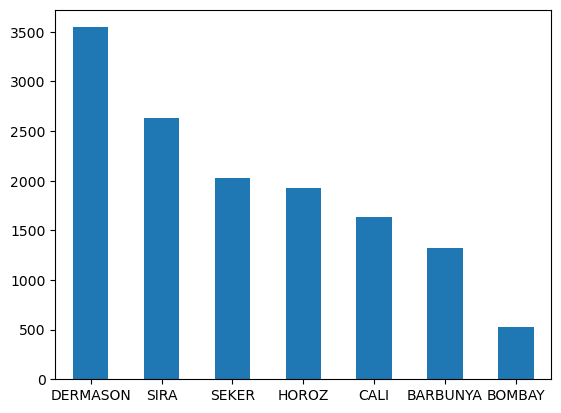

In [15]:
count_class = pd.value_counts(df_root["Class"],sort = True)
count_class.plot(kind='bar',rot = 0)

Its is multiclass classification problem with bombay class having lesser data.

<b>Looking for duplicate rows</b>

Number of rows in the dataset that repeat is zero

In [16]:
df_root[df_root.duplicated()]

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class


#### Correlational Analysis

Correlation analysis is a statistical method used to measure the strength of the linear relationship between two variables and compute their association.<br>
Correlation analysis calculates the level of change in one variable due to the change in the other.
<br>A high correlation points to a strong relationship between the two variables, while a low correlation means that the variables are weakly related.

In [17]:
df_tmp = df_root.drop(columns=['Bean ID'])
df_root.corr()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Bean ID,1.000000,-0.369273,-0.411175,-0.325045,-0.503044,0.139316,0.307748,-0.369615,-0.418614,-0.099929,0.087452,0.115936,-0.200357,0.602935,0.074558,-0.223753,0.058103
Area,-0.369273,1.000000,0.966722,0.931836,0.951615,0.241692,0.267351,0.999939,0.984968,0.054345,-0.196511,-0.357530,-0.267840,-0.847983,-0.639305,-0.272145,-0.355721
Perimeter,-0.411175,0.966722,1.000000,0.977337,0.913217,0.385228,0.390915,0.967689,0.991380,-0.021160,-0.303887,-0.547647,-0.406618,-0.864671,-0.767606,-0.408435,-0.429310
MajorAxisLength,-0.325045,0.931836,0.977337,1.000000,0.826119,0.550200,0.541746,0.932609,0.961732,-0.077982,-0.284203,-0.596303,-0.568118,-0.773699,-0.859237,-0.568093,-0.482477
MinorAxisLength,-0.503044,0.951615,0.913217,0.826119,1.000000,-0.009318,0.019272,0.951353,0.948567,0.145987,-0.155750,-0.210290,-0.014734,-0.947207,-0.471539,-0.019175,-0.263713
AspectRation,0.139316,0.241692,0.385228,0.550200,-0.009318,1.000000,0.924293,0.243258,0.303601,-0.370102,-0.267582,-0.766946,-0.987689,0.024676,-0.837749,-0.978591,-0.449225
Eccentricity,0.307748,0.267351,0.390915,0.541746,0.019272,0.924293,1.000000,0.269124,0.318512,-0.319300,-0.297427,-0.722177,-0.970308,0.020108,-0.859938,-0.981057,-0.449276
ConvexArea,-0.369615,0.999939,0.967689,0.932609,0.951353,0.243258,0.269124,1.000000,0.985226,0.052564,-0.206118,-0.362083,-0.269698,-0.847975,-0.640876,-0.274024,-0.362049
EquivDiameter,-0.418614,0.984968,0.991380,0.961732,0.948567,0.303601,0.318512,0.985226,1.000000,0.028383,-0.231566,-0.435945,-0.327391,-0.892783,-0.713083,-0.330389,-0.392512
Extent,-0.099929,0.054345,-0.021160,-0.077982,0.145987,-0.370102,-0.319300,0.052564,0.028383,1.000000,0.191330,0.344411,0.354102,-0.141634,0.237880,0.347624,0.148502


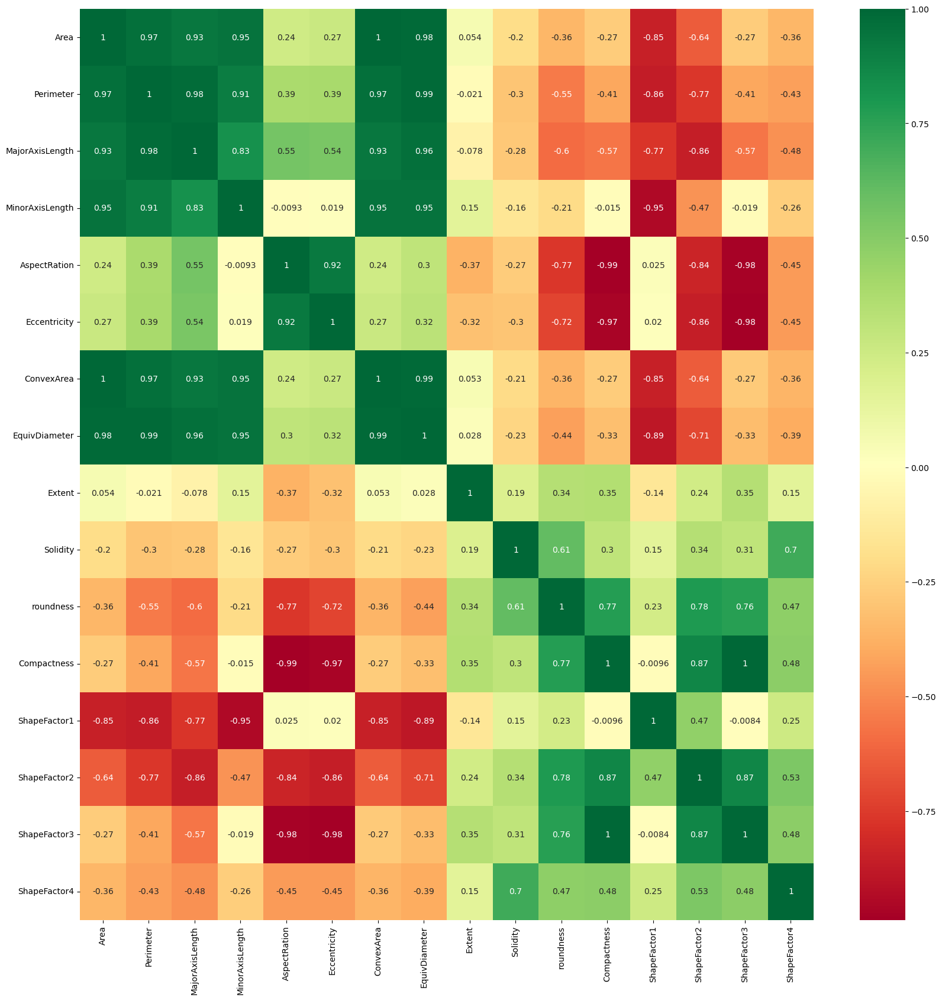

In [18]:
corrmat  = df_tmp.corr()
#Correlation plot
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))

#plot heat map
g=sns.heatmap(df_tmp[top_corr_features].corr(),annot=True,cmap="RdYlGn")

<b>PairPlot</b><br>
A pairplot plot a pairwise relationships in a dataset. The pairplot function creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column. That creates plots as shown below.

<Figure size 4000x4000 with 0 Axes>

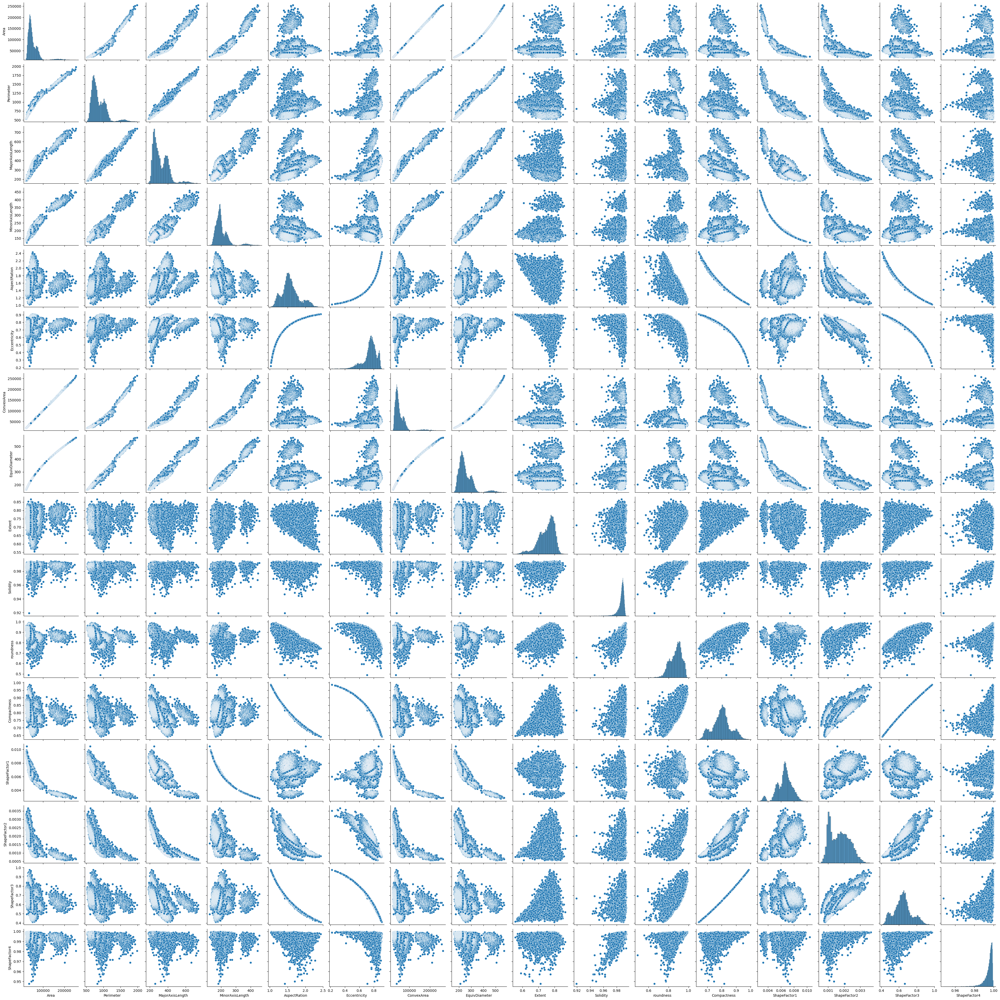

In [19]:
plt.figure(figsize = (40,40))

sns.pairplot(data=df_tmp)

It is clearly visible that there is multicollinearity between the features

Based on the heatmap and correlation data from above we can say that their is <b>MultiCollinearity</b> between the dependent features in the data<br><br>
<b>MultiCollinearity</b> : Multicollinearity is a statistical concept where several independent variables in a model are correlated. Two variables are considered to be perfectly collinear if their correlation coefficient is +/- 1.0. Multicollinearity among independent variables will result in less reliable statistical inferences

Example : Area is highly correlated with ShapeFactor2,ConvexArea and EquiDiameter where ConvexArea and Equidiameter show positive correlation and ShapeFactor2 shows negative correlation|

### 3.4 Feature Engineering
Feature engineering is the process of selecting, manipulating, and transforming raw data into features that can be used in supervised learning. In order to make machine learning work well on new tasks, it might be necessary to design and train better features. As you may know, a “feature” is any measurable input that can be used in a predictive model — it could be the color of an object or the sound of someone’s voice. Feature engineering, in simple terms, is the act of converting raw observations into desired features using statistical or machine learning approaches.

#### Removing Unnecessary Data columns

Removing Rows that dont contribute to the learning of the model like Indexes in this dataset
<br>The total sum of rows that have a missing value is 19.<br>
When compared to the total rows(14,000) is very less. So we can drop the rows as the information loss will be minium

In [20]:
df_root.drop(columns= ["Bean ID"],inplace=True)

#### NUll or Missing values

Handlind Missing or Null values in the dependent varialbles,

In [21]:
df_root.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    2
MinorAxisLength    3
AspectRation       1
Eccentricity       2
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           3
roundness          0
Compactness        4
ShapeFactor1       4
ShapeFactor2       2
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

<b>Number of rows will Null values are less and doesnt effect the distribution of the dataset, we can drop the rows</b>
<br>After dropping the rows their is not no change in the statistical parameters of the data

In [22]:
df_root = df_root.dropna()
print(df_root.shape)
df_root.head()

(13591, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER


In [23]:
df_root.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [24]:
df_root.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000,13591.000000
mean,53077.569421,855.565981,320.281091,202.292563,1.583801,0.751189,53797.983298,253.134391,0.749698,0.987141,0.873174,0.799700,0.006563,0.001714,0.643315,0.995059
std,29335.656114,214.319365,85.679586,44.999344,0.246422,0.091731,29786.623118,59.192047,0.049109,0.004662,0.059491,0.061607,0.001129,0.000595,0.098800,0.004368
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36373.000000,703.897000,253.441135,175.792208,1.432988,0.716251,36750.000000,215.201166,0.718527,0.985669,0.832015,0.762366,0.005898,0.001153,0.581202,0.993695
50%,44674.000000,795.194000,297.079966,192.476741,1.551509,0.764576,45224.000000,238.496758,0.759785,0.988282,0.883061,0.801138,0.006644,0.001692,0.641822,0.996381
75%,61352.000000,977.360500,376.520088,217.124066,1.707447,0.810550,62326.500000,279.492026,0.786858,0.990011,0.916797,0.834010,0.007273,0.002168,0.695572,0.997877
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


#### Dealing with Target feature

Target Column is a categorical Column with 7 different classes.<br>
As it is a classification problem we can map each class to a numerical value and replace in the dataset

In [25]:
dict_Class = {k:v for k, v in zip(list(set(df_root.iloc[:, -1].tolist())),
                                     list(range(len(list(set(df_root.iloc[:, -1].tolist()))))))}
dict_Class

{'SIRA': 0,
 'CALI': 1,
 'BARBUNYA': 2,
 'BOMBAY': 3,
 'HOROZ': 4,
 'DERMASON': 5,
 'SEKER': 6}

In [26]:
df_root["Class"] = df_root["Class"].map(dict_Class)
df_root.head(8)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,6
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,6
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,6
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,6
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,6
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,6
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,6
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,6


In [27]:
set(df_root.Class)

{0, 1, 2, 3, 4, 5, 6}

#### Check Distribution of Features

The distribution provides a parameterized mathematical function that can be used to calculate the probability for any individual observation from the sample space. This distribution describes the grouping or the density of the observations, called the probability density function. We can also calculate the likelihood of an observation having a value equal to or lesser than a given value. A summary of these relationships between observations is called a cumulative density function.

All the columns are almost follow a normal distributed so no need to Transformation of the data to make them Normally Distributed

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')


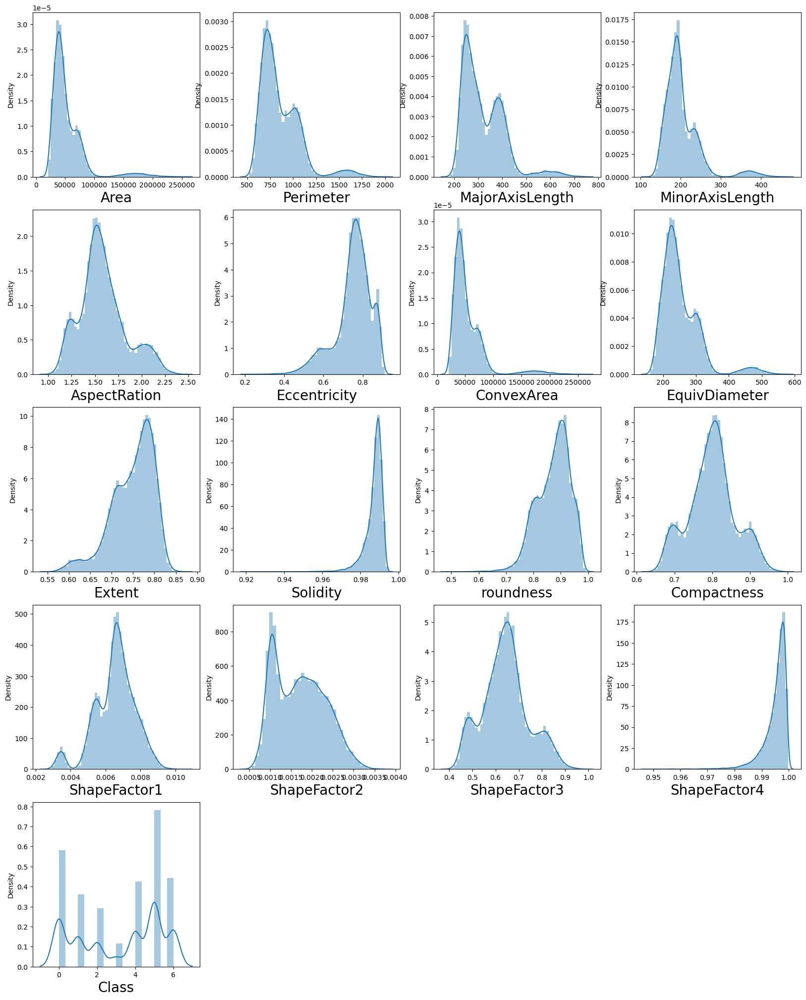

In [28]:
# let's see how data is distributed for every column
df_tmp = df_root.copy()
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1
print(df_tmp.columns)
for column in df_tmp:
    if plotnumber<=18 :
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(df_tmp[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

<b>Most of the columns are normally distributed but some have skewness due to Outliers</b>

In [29]:
print("skewness of each column")
for col in df_root:
    print(col,"->",df_root[col].skew())

skewness of each column
Area -> 2.951255591634598
Perimeter -> 1.6249749765014962
MajorAxisLength -> 1.357668268523544
MinorAxisLength -> 2.2357427157936804
AspectRation -> 0.5840957384901392
Eccentricity -> -1.0656828186476266
ConvexArea -> 2.9401487885739988
EquivDiameter -> 1.9475874509888866
Extent -> -0.8937382041693148
Solidity -> -2.5501567504367912
roundness -> -0.6356652140480243
Compactness -> 0.03596081606550084
ShapeFactor1 -> -0.5328984958350058
ShapeFactor2 -> 0.29964487288934977
ShapeFactor3 -> 0.24173496281589082
ShapeFactor4 -> -2.758829845636853
Class -> -0.2649585577652762


#### Outlier Handling

Outliers are those data points which differs significantly from other observations present in given dataset. It can occur because of variability in measurement and due to misinterpretation in filling data points.

In [30]:
df_outlier = df_root.drop(columns=["Class"])
df_outlier.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236


<b>Checking for outliers</b>

<AxesSubplot: >

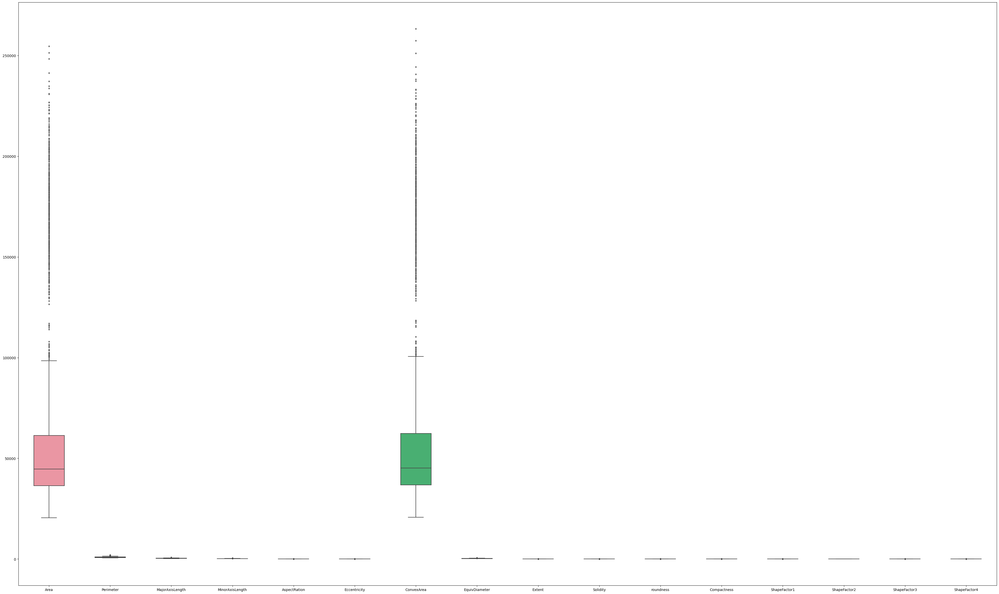

In [31]:
fig, ax = plt.subplots(figsize=(50,30))
sns.boxplot(data=df_outlier, width= 0.5,ax=ax,  fliersize=3)

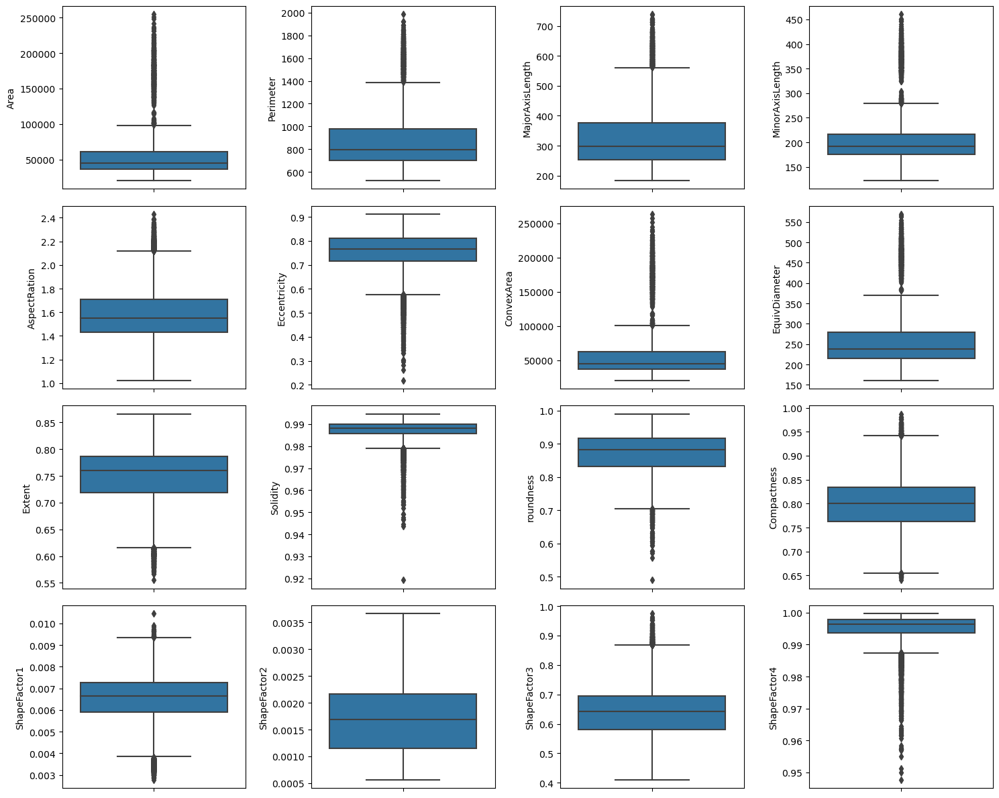

In [32]:
# Show BoxPlot for all features before outlier handling
Numeric_cols = df_outlier.columns

fig, ax = plt.subplots(4, 4, figsize=(15, 12))

for variable, subplot in zip(Numeric_cols, ax.flatten()):
    sns.boxplot(y= df_outlier[variable], ax=subplot)
plt.tight_layout()

<p>Many Outliers in the data espically in "Area" and "ConvexArea" columns<br>
Option 1 : Deleting the outlier can cause a data loss of about 3000rows so to avoid that we can use some other method<br>
Option 2 : Replace outlier with boundary of the distribution but as the count of the outlers is huge it will produce skewness in the data<br>
    Option 3 : So we can replace the outliers with the <b>Median</b> as median is not effected by the outliers
</p>

In [33]:
print("skewness of each column after Outlier Handling")
for column in df_outlier.columns:
    Q1= np.percentile(df_outlier[column], 25,interpolation = 'midpoint')
    Q3 = np.percentile(df_outlier[column], 75, interpolation = 'midpoint')
    IQR = Q3 - Q1
    
    median = df_outlier[column].quantile(0.50)
    df_outlier[column] = np.where(df_outlier[column] <=(Q1-1.5*IQR), median,df_outlier[column])
    df_outlier[column] = np.where(df_outlier[column] >=(Q3+1.5*IQR), median,df_outlier[column])
    print(column, "->", df_outlier[column].skew())

skewness of each column after Outlier Handling
Area -> 0.8307316808641193
Perimeter -> 0.5972444343605717
MajorAxisLength -> 0.6381489693556291
MinorAxisLength -> 0.563755537978312
AspectRation -> 0.38708340238809047
Eccentricity -> -0.4766498859275242
ConvexArea -> 0.8362281840709223
EquivDiameter -> 0.5576262828876315
Extent -> -0.6504259333743141
Solidity -> -0.7714516405620646
roundness -> -0.42433582580678303
Compactness -> -0.01601212958683773
ShapeFactor1 -> 0.05792896799797322
ShapeFactor2 -> 0.29964487288934977
ShapeFactor3 -> 0.12236241153619266
ShapeFactor4 -> -1.0527209991671123


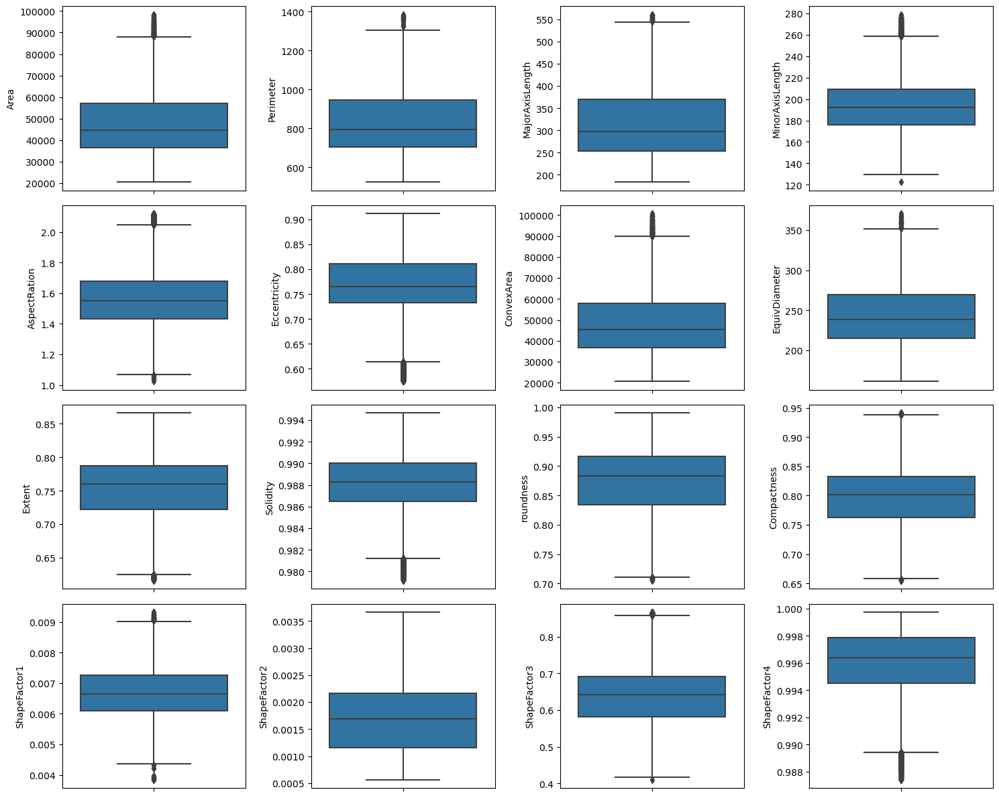

In [34]:
# Show BoxPlot for all features after outlier handling 

Numeric_cols = df_outlier.columns

fig, ax = plt.subplots(4, 4, figsize=(15, 12))

for variable, subplot in zip(Numeric_cols, ax.flatten()):
    sns.boxplot(y= df_outlier[variable], ax=subplot)
plt.tight_layout()

After Replacing the outliers with Median(robust to Outliers) the data looks good and outliers are lose of the boundaries which can be considered for building the data<br>
Also the distribution of the data is also not skewed after removal of outliers


#### Standardization and Normalization of Features

Feature scaling is one of the most important data preprocessing step in machine learning. Algorithms that compute the distance between the features are biased towards numerically larger values if the data is not scaled.

<b>Normalization or Min-Max Scaling</b> :  is used to transform features to be on a similar scale. The new point is calculated as:

<b>Standardization or Z-Score Normalization</b> :  is the transformation of features by subtracting from mean and dividing by standard deviation. This is often called as Z-score.

X_new = (X - mean)/Std
<br>
Standardization can be helpful in cases where the data follows a Gaussian distribution
<br><br>
Data is normally Distributed so just applying Standard Scaling is enough

<b>Standard Scaling</b>

In [35]:
trans = StandardScaler()
data = trans.fit_transform(df_outlier)
df_rootSS = pd.DataFrame(data,columns=df_outlier.columns)

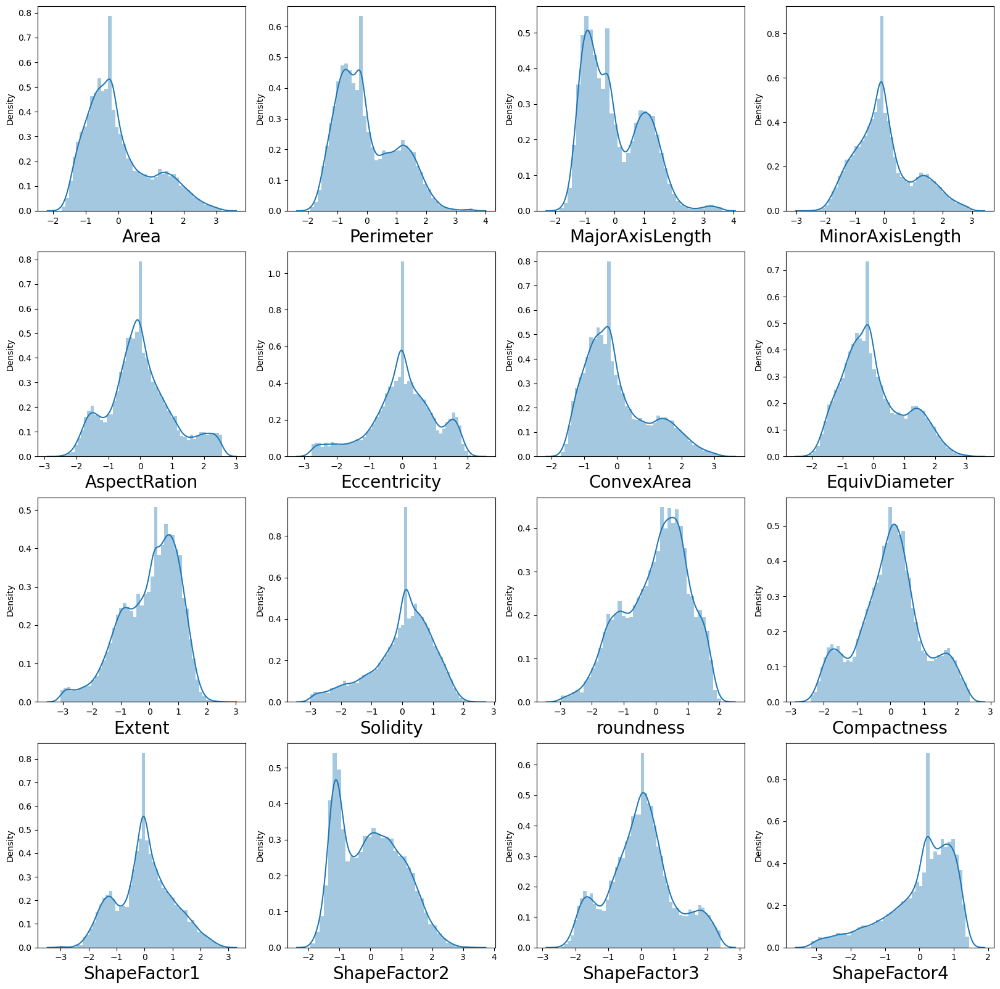

In [36]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1
for column in df_rootSS.columns:
    if plotnumber<=18 :
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(df_rootSS[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

<b>Robust Scaling</b>

In [37]:
scalar = RobustScaler()
df_rootRB = pd.DataFrame(scalar.fit_transform(df_outlier))

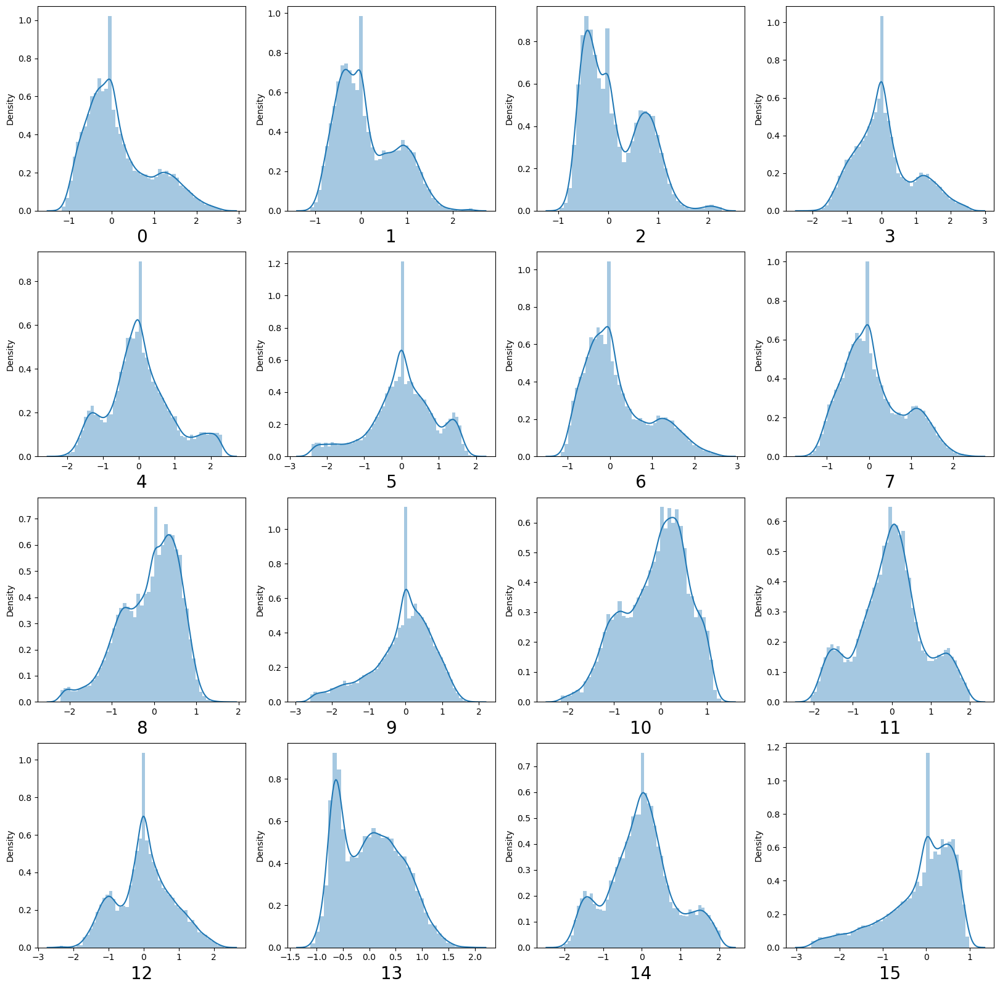

In [38]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1
for column in df_rootRB.columns:
    if plotnumber<=18 :
        ax = plt.subplot(5,4,plotnumber)
        sns.distplot(df_rootRB[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

In [39]:
dict_skew = {
    "Column" : df_rootSS.skew().index,
    "Standard Scaling" : df_rootSS.skew().values,
    "Robust Scaling" : df_rootRB.skew().values
} 
skewness_df = pd.DataFrame(dict_skew)
skewness_df

,Column,Standard Scaling,Robust Scaling
0,Area,0.830732,0.830732
1,Perimeter,0.597244,0.597244
2,MajorAxisLength,0.638149,0.638149
3,MinorAxisLength,0.563756,0.563756
4,AspectRation,0.387083,0.387083
5,Eccentricity,-0.476650,-0.476650
6,ConvexArea,0.836228,0.836228
7,EquivDiameter,0.557626,0.557626
8,Extent,-0.650426,-0.650426
9,Solidity,-0.771452,-0.771452


<b>From the Table above we can see that both Transformation give same results and data is Normally Distributed so no other transformations are required</b>
<br> Both Scaling techniques give same result, so we can use any of the scalling techniques here we went ahead with Standard Scaler

In [40]:
df_prime = df_rootSS.copy()
df_prime["Class"] = list(df_root["Class"])

### 3.4. Feature Selection
Feature selection is a way of selecting the subset of the most relevant features from the original features set by removing the redundant, irrelevant, or noisy features.

#### MultiCollinearlity(vif)

<b>Variance Inflation Factor</b> : A variance inflation factor(VIF) detects multicollinearity in regression analysis. Multicollinearity is when there’s correlation between predictors (i.e. independent variables) in a model; it’s presence can adversely affect your regression results. The VIF estimates how much the variance of a regression coefficient is inflated due to multicollinearity in the model.

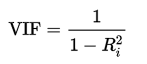

We need to remove the columns with high VIF score so that score of all features gets below 5<br>
So we need to remove Feature with high VIFs and again calculate for all the rest of the columns and continue to do so until all the columns score is around 5

In [41]:
def vif_score(x):
    scalar = StandardScaler()
    arr = scalar.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns = ["Features","VIF_Score"])

vif_score(df_prime)

,Features,VIF_Score
0,Area,987.153226
1,Perimeter,37.542975
2,MajorAxisLength,10.374049
3,MinorAxisLength,28.637132
4,AspectRation,5.677588
5,Eccentricity,4.416012
6,ConvexArea,1014.441048
7,EquivDiameter,105.839994
8,Extent,1.117345
9,Solidity,1.908077


In [42]:
df_tmp = df_prime.copy()

In [43]:
df_tmp.drop(columns=['Class'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,987.129191
1,Perimeter,37.507568
2,MajorAxisLength,10.226324
3,MinorAxisLength,28.634145
4,AspectRation,5.676114
5,Eccentricity,4.415332
6,ConvexArea,1014.440900
7,EquivDiameter,105.643845
8,Extent,1.117034
9,Solidity,1.863884


In [44]:
df_tmp.drop(columns=['ConvexArea'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,44.239569
1,Perimeter,37.261501
2,MajorAxisLength,10.226292
3,MinorAxisLength,28.441701
4,AspectRation,5.673256
5,Eccentricity,4.413360
6,EquivDiameter,105.241687
7,Extent,1.116506
8,Solidity,1.830235
9,roundness,6.110601


In [45]:
df_tmp.drop(columns=['EquivDiameter'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,26.377697
1,Perimeter,30.865171
2,MajorAxisLength,10.133648
3,MinorAxisLength,25.818747
4,AspectRation,5.632993
5,Eccentricity,4.412026
6,Extent,1.116506
7,Solidity,1.821931
8,roundness,6.071027
9,Compactness,28.416524


In [46]:
df_tmp.drop(columns=['Perimeter'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,20.837077
1,MajorAxisLength,8.639152
2,MinorAxisLength,25.759283
3,AspectRation,5.632554
4,Eccentricity,4.410109
5,Extent,1.114657
6,Solidity,1.821883
7,roundness,4.941783
8,Compactness,28.276408
9,ShapeFactor1,16.614149


In [47]:
df_tmp.drop(columns=['Compactness'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,20.170413
1,MajorAxisLength,8.635127
2,MinorAxisLength,25.306934
3,AspectRation,5.353142
4,Eccentricity,4.392590
5,Extent,1.113670
6,Solidity,1.812668
7,roundness,4.883257
8,ShapeFactor1,16.410663
9,ShapeFactor2,9.602287


In [48]:
df_tmp.drop(columns=['MinorAxisLength'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,Area,12.622901
1,MajorAxisLength,8.574261
2,AspectRation,5.305245
3,Eccentricity,4.392573
4,Extent,1.113173
5,Solidity,1.802818
6,roundness,4.869437
7,ShapeFactor1,8.727018
8,ShapeFactor2,9.581197
9,ShapeFactor3,11.006606


In [49]:
df_tmp.drop(columns=['Area'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,MajorAxisLength,7.322690
1,AspectRation,5.170812
2,Eccentricity,4.387638
3,Extent,1.112438
4,Solidity,1.791607
5,roundness,4.790035
6,ShapeFactor1,3.378236
7,ShapeFactor2,9.444791
8,ShapeFactor3,10.625017
9,ShapeFactor4,1.655286


In [50]:
df_tmp.drop(columns=['ShapeFactor3'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,MajorAxisLength,7.183420
1,AspectRation,4.700802
2,Eccentricity,3.190545
3,Extent,1.111899
4,Solidity,1.781582
5,roundness,4.555491
6,ShapeFactor1,2.768339
7,ShapeFactor2,8.582353
8,ShapeFactor4,1.652437


In [51]:
df_tmp.drop(columns=['ShapeFactor2'],inplace=True)
vif_score(df_tmp)

,Features,VIF_Score
0,MajorAxisLength,5.478921
1,AspectRation,3.795605
2,Eccentricity,3.179796
3,Extent,1.108359
4,Solidity,1.744490
5,roundness,4.142303
6,ShapeFactor1,2.766302
7,ShapeFactor4,1.574653


In [52]:
vif_var = vif_score(df_tmp)
colms = (vif_var["Features"].values)
df_prime = df_prime[np.append(colms,"Class")]

In [53]:
df_prime.head()

,MajorAxisLength,AspectRation,Eccentricity,Extent,Solidity,roundness,ShapeFactor1,ShapeFactor4,Class
0,-1.494114,-1.673551,-0.025058,0.249564,0.300339,1.467362,0.697402,1.072735,6
1,-1.604958,-2.132047,-0.025058,0.703317,-1.018448,0.217883,0.320377,0.962874,6
2,-1.426796,-1.616047,-0.025058,0.570786,0.539801,1.288237,0.603806,1.200817,6
3,-1.585795,-2.299943,-0.025058,0.457261,0.994507,1.939919,0.019427,1.238212,6
4,-1.430643,-1.793529,-0.025058,0.515899,0.523115,1.217878,0.364620,1.264304,6


<b>MultiCollinearily removed</b>

#### HeatMap Correlation

                 MajorAxisLength  AspectRation  Eccentricity    Extent  \
MajorAxisLength         1.000000      0.623954      0.594229 -0.113960   
AspectRation            0.623954      1.000000      0.790845 -0.253065   
Eccentricity            0.594229      0.790845      1.000000 -0.218750   
Extent                 -0.113960     -0.253065     -0.218750  1.000000   
Solidity               -0.291867     -0.292597     -0.254339  0.178352   
roundness              -0.718971     -0.716648     -0.695146  0.254880   
ShapeFactor1           -0.628504     -0.026844     -0.031794 -0.074377   
ShapeFactor4           -0.484125     -0.486231     -0.435788  0.096686   
Class                  -0.488451     -0.372947     -0.317138  0.060329   

                 Solidity  roundness  ShapeFactor1  ShapeFactor4     Class  
MajorAxisLength -0.291867  -0.718971     -0.628504     -0.484125 -0.488451  
AspectRation    -0.292597  -0.716648     -0.026844     -0.486231 -0.372947  
Eccentricity    -0.254339  -

<AxesSubplot: >

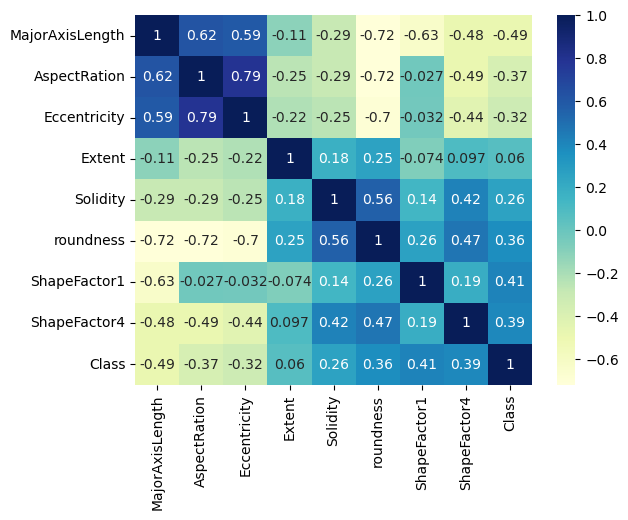

In [54]:
print(df_prime.corr())
sns.heatmap(df_prime.corr(), cmap="YlGnBu", annot=True)

<b>There is no high correlation between features and target variables</b>

#### Principle Component Analysis

Principal Component Analysis is an unsupervised learning algorithm that is used for the <b>dimensionality decomposition</b> in machine learning. It is a statistical process that converts the observations of correlated features into a set of linearly uncorrelated features with the help of orthogonal transformation. These new transformed features are called the Principal Components

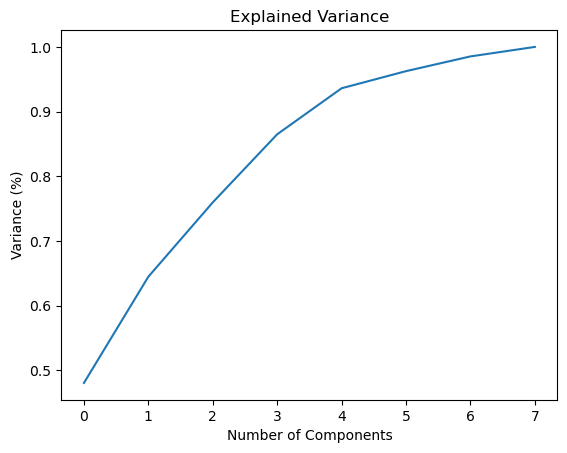

In [55]:
pca = PCA()
principalComponents = pca.fit_transform(df_prime.drop(columns=["Class"]))
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

<p>From the diagram above, it can be seen that 4 principal components explain almost 90% of the variance in data and 6 principal components explain around 95% of the variance in data.
<br>
So, instead of giving all the columns as input, we’d only feed these 5 principal components of the data to the machine learning algorithm and we’d obtain a similar result.</p>

In [56]:
pca = PCA(n_components=5)
new_data = pca.fit_transform(df_prime.drop(columns=["Class"]))
# This will be the new data fed to the algorithm.
principal_Df = pd.DataFrame(data = new_data
             , columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5'])
principal_Df['Class'] = list(df_prime["Class"])
principal_Df

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,Class
0,-2.655565,-0.497196,0.148967,0.136680,-0.270488,6
1,-1.916533,-0.017437,1.229663,0.852133,-1.178407,6
2,-2.663991,-0.277538,-0.180201,0.198720,-0.432386,6
3,-3.343154,0.255319,-0.204249,-0.251362,-0.000988,6
4,-2.675149,-0.087268,-0.069893,0.050199,-0.487487,6
...,...,...,...,...,...,...
13586,-0.958646,-0.624323,-0.386779,-1.174194,-0.005368,5
13587,-1.653223,0.543385,-0.924785,0.178687,-0.296305,5
13588,-1.129661,-0.140446,0.005781,-0.691203,0.427898,5
13589,-0.482116,-0.461576,0.769115,-0.613146,0.705906,5


Number of columns are decreased from 18 to 8 usinf ViF scores and from 8 to 5 using Principle Component Analysis(Curse of Dimensionality reduced)

## 3.5 Identify the target variables.
Split Independent and Dependent Features

In [57]:
X = df_prime.drop(columns = ["Class"])
y = df_prime.Class

#### Label Encoding Target variable 

In [58]:
encoder = LabelEncoder()
encoder.fit(y)
encoded_Y = encoder.transform(y)
# convert integers to dummy variables (i.e. one hot encoded)
dummy_y = np_utils.to_categorical(encoded_Y)

## 3.6 Split the data into training set and testing set

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X,dummy_y,test_size=0.2,random_state=101)

In [60]:
X_train.shape


(10872, 8)

In [61]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((10872, 8), (2719, 8), (10872, 7), (2719, 7))

## 3.7 Report

Dataset contains 18 columns and 13611 records. 
- At the independent columns are continuous and target(dependent column) is a categorical variable<br>
- Total columns in the dataset are 18 where 17 are Independent features and 1 is a dependent features


1. Missing values : Total of 20 records had missing values so the suitable option to deal with missing values is byb dropping the rows
so number of records can to 13591
2. Normalization and Standardizarion : all the required columns are nearly normally distributed and three standardization techniques 
StandScaler, Robust and MinMax Scaling where applied on the same dataset and StandScaler is selected as it  gives better result
3. Outlier Handling : outliers are detected in the dataset. All the outliers are converted to median inorder to preserve the distribution
of the dataset.
4. Removing Columns:
	->  "Bean ID" feature is not required for model creation as it doesnt contribute any data
	->  MultiCollinearity : from the headmap we can observe there is multicollinearity exists between the independent features.
		Using the VIF score(Variance Inflation Factor) multiple features are removed 

Resulting Data : Number of features reduced to 9 including the target feature


5. Target Column :  Since it is a multiclass classification problem, Target feature has 7 class, which are going to be converted to vectors 
using LabelEncoding before applying ANN model

Total Columns increase from 9 to 15 where 9 are independent and 7 are dependent feature.

6. Train Test Split : data is split with 80:20 ratio for training and testing repectively.
	Train data : 10872 by 15
	Test data : 2719 by 15
	
	Detailed : X_train = (10872, 8), X_test = (2719, 8), y_train = (10872, 7), y_test = (2719, 7)

# 4. Deep Neural Network Architecture

## 4.1 Design the architecture

## 4.1.1  Model Building

In [62]:
model = Sequential()
model.add(Dense(10, input_shape = (8,), activation = "relu"))
model.add(Dense(15, activation = "relu"))
model.add(Dropout(0.2))
model.add(Dense(7, activation = "softmax"))


## 4.2 Report

* Number of layers is 5 and units of each layer : 
	- Input Layer - 8 input units to send 8 features of the dataset into the model
	- Deep Layers  
			- Dense Layer 1 - Number of units is 10 and number of Parameters present in the 
						layer are 90  
			- Dense layer 2 - Number of units is 15 and number of Parameters present in the 
						layer are 165  
			- Dropout Layer - Dropout layer has been added to avoid overfitting and have 
						regularization in the model. Dropout percentage is set to 20.   
	- Output Layer - Output Layer has 7 units where each unit represents a class of the target 
				column. Each node give probability of the records belonging to the class

* Activation function used in each hidden layer:  
	-Input Layer
	- Deep Layer :   
			- Dense Layer 1 : ReLu activation Function  
			- Dense Layer 2 : ReLu activation Function
* Activation function used in the output layer : Softmax, inorder to get the probability of each class in the target feature
* Total number of parameters :
	- Total Parameter is 367
	- Trainable is 367
	- Non Trainable is 0

# 5. Training the model

## 5.1 Configure the training

In [63]:
model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                90        
                                                                 
 dense_1 (Dense)             (None, 15)                165       
                                                                 
 dropout (Dropout)           (None, 15)                0         
                                                                 
 dense_2 (Dense)             (None, 7)                 112       
                                                                 
Total params: 367
Trainable params: 367
Non-trainable params: 0
_________________________________________________________________


## 5.2 Train the model

In [64]:
model.fit(x=X_train,y=y_train,
          validation_data=(X_test,y_test),
          batch_size=128,epochs=200)

Epoch 1/200
85/85 [==============================] - 1s 5ms/step - loss: 1.6905 - accuracy: 0.3592 - val_loss: 1.4169 - val_accuracy: 0.4759
Epoch 2/200
85/85 [==============================] - 0s 2ms/step - loss: 1.2925 - accuracy: 0.4925 - val_loss: 1.0844 - val_accuracy: 0.6105
Epoch 3/200
85/85 [==============================] - 0s 2ms/step - loss: 1.0489 - accuracy: 0.6213 - val_loss: 0.8739 - val_accuracy: 0.7275
Epoch 4/200
85/85 [==============================] - 0s 2ms/step - loss: 0.8968 - accuracy: 0.6854 - val_loss: 0.7317 - val_accuracy: 0.7738
Epoch 5/200
85/85 [==============================] - 0s 2ms/step - loss: 0.7883 - accuracy: 0.7295 - val_loss: 0.6279 - val_accuracy: 0.8051
Epoch 6/200
85/85 [==============================] - 0s 2ms/step - loss: 0.6933 - accuracy: 0.7682 - val_loss: 0.5536 - val_accuracy: 0.8282
Epoch 7/200
85/85 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7897 - val_loss: 0.5091 - val_accuracy: 0.8396
Epoch 8/200
8

# 6. Test the model (Performance Evaluation)

#### Training loss per epoch
* This plot shows the training loss per epoch.
* This plot helps us to see if there is overfitting in the model. In this case there is no overfitting because both lines go down at the same time. 

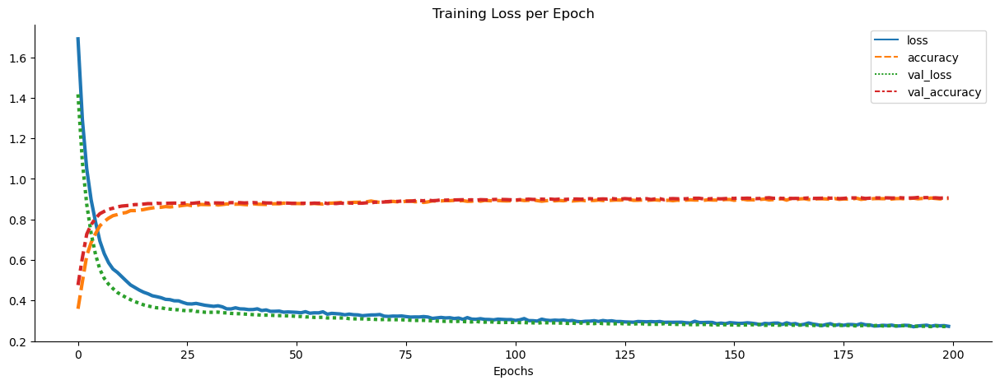

In [65]:
losses = pd.DataFrame(model.history.history)

plt.figure(figsize=(15,5))
sns.lineplot(data=losses,lw=3)
plt.xlabel('Epochs')
plt.ylabel('')
plt.title('Training Loss per Epoch')
sns.despine()

##### Accuracy of the Model

In [66]:
cvscores = []
scores = model.evaluate(X_test, y_test, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
cvscores.append(scores[1] * 100)
 
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

accuracy: 90.62%
90.62% (+/- 0.00%)


In [67]:
y_pred = model.predict(X_test)


85/85 [==============================] - 0s 772us/step


#### Confusion Matrix

 performance measurement for machine learning classification problem where output can be two or more classes. It is a table with 4 different combinations of predicted and actual values.


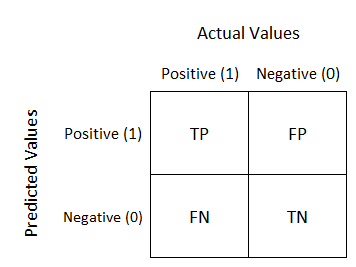
<br>
It is extremely useful for measuring Recall, Precision, Specificity, Accuracy, and most importantly AUC-ROC curves.

In [68]:
print("Confusion Matrix")
matrix = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1))
matrix

Confusion Matrix


array([[464,   0,   1,   4,   5,  57,   2],
       [  3, 312,  12,   0,  11,   0,   0],
       [  5,  36, 217,   1,   1,   0,   1],
       [ 11,   1,   1,  94,   0,   0,   0],
       [ 13,   7,   2,   1, 353,   3,   0],
       [ 37,   0,   0,   0,   2, 650,   7],
       [ 18,   0,   2,   0,   0,  11, 374]], dtype=int64)

In [69]:
dict_Class

{'SIRA': 0,
 'CALI': 1,
 'BARBUNYA': 2,
 'BOMBAY': 3,
 'HOROZ': 4,
 'DERMASON': 5,
 'SEKER': 6}

In [70]:
cm_df = pd.DataFrame(matrix,
                     index = list(dict_Class.keys()) , 
                     columns = list(dict_Class.keys()))

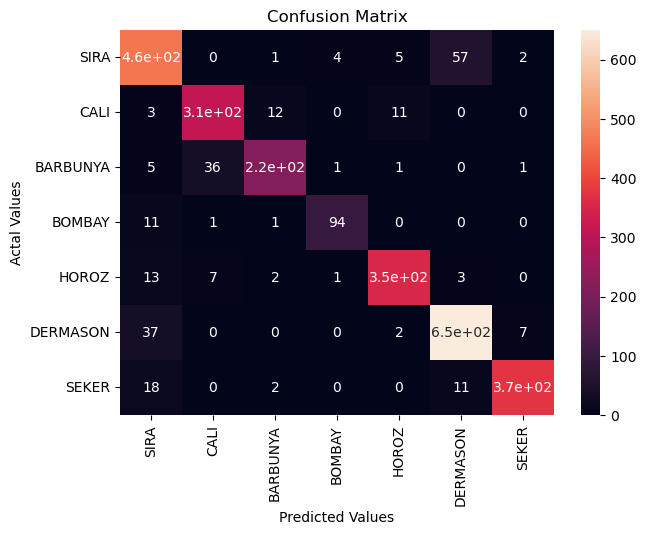

In [71]:
plt.figure(figsize=(7,5))
sns.heatmap(cm_df, annot=True)
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

#### Accuracy,Precision, Recall, f1 score, 
<b>Accuracy :</b> The base metric used for model evaluation is often Accuracy, describing the number of correct predictions over all predictions<br>
<center><b>Accuracy = (TP + TN)/(TP + FP + TN + FN)</b></center>
<br>
<b>Recall</b> : Recall is a measure of how many of the positive cases the classifier correctly predicted, over all the positive cases in the data<br>
<center><b>Recall = TruePositives / (TruePositives + FalseNegatives)</b></center>
<br>
<b>Precision</b>  : Precision is a measure of how many of the positive predictions made are correct (true positives)<br>
<center><b>Precision = TruePositives / (TruePositives + FalsePositives)</b></center>
<br>
<b>F1 Score </b> :F1-Score is a measure combining both precision and recall. It is generally described as the harmonic mean of the two.
<br>
<center><b>F-Measure = (2 * Precision * Recall) / (Precision + Recall)</b></center>


In [72]:
print("Classification Evaluation Matrix")
print("Accuracy Score : ",accuracy_score(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print("Precision Score : ",precision_score(y_test.argmax(axis=1), y_pred.argmax(axis=1),average="weighted",))
print("Recall Score : ",recall_score(y_test.argmax(axis=1), y_pred.argmax(axis=1),average="weighted"))
print("F1 Score : ",f1_score(y_test.argmax(axis=1), y_pred.argmax(axis=1),average="weighted"))

Classification Evaluation Matrix
Accuracy Score :  0.9062155204119161
Precision Score :  0.9077649105004335
Recall Score :  0.9062155204119161
F1 Score :  0.9064117286633654


## 7. Conclusion 


We performed multi-class classification on dry beans dataset. 
To achieve the same data below steps were followed -
1. Exploratory Data Analysis - 
2. Feature Engineering
3. Feature Selection
4. Model Building - <br>
    i.   Implemented using ANN model <br>
    ii.  Trained Model <br>
5. Performance Evaluation - <br>
    i.   Performance evaluation done using confusion matrix, precision, recall, accuracy and F-score <br>
    ii . We can conclude that the model performs well with average accuracy of 90% 

## 8. Solution

We have developed a deep learning model to perform a multi-classification of dry beans
 species harvested from population cultivation from a single farm.

- That dataset has more number of class to be classfied.
- Dataset used has high multicollinearity inbetween the independent variables.
- Missing, null values and outliers are less implying the data source is good
- Converstion of dataset into format suitable for Deep Learning model is a challenge as the target column has many class
- Training the model in local system is very difficult as the hardware required for training DL models need to be better 
- Training for higher number of Epochs is no possible in local systems is no possible.
- As deep learning models are very data intensive, having more number of records is recommended to build, train and 
test the model extensively